# Voice Quality Analyzer

### Импортируем нужные модули

In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from pydub.generators import Sine
from pydub import AudioSegment

In [3]:
from tempfile import NamedTemporaryFile, TemporaryFile
import os

In [4]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


### Создаем две синусоиды з частотами 300Hz и 600Hz

In [5]:
sine_wave_300 = Sine(freq=300)
sine_wave_600 = Sine(freq=600)

### Можем прослушать полученный "звук"

#### Волна с частотой 300Hz

In [6]:
audio_segment_sine_wave_300 = sine_wave_300.to_audio_segment(duration=1000.0*5)
audio_segment_sine_wave_300

#### Волна с частотой 600Hz

In [7]:
audio_segment_sine_wave_600 = sine_wave_600.to_audio_segment(duration=1000.0*5)
audio_segment_sine_wave_600

### Реализуем функцию для генерации комбинации двух синусоид (а так же общий случай для множества входных синусоид)

In [226]:
def gen_comb_of_two_sine(first_sine=Sine(freq=300), second_sine=Sine(freq=600), first_duration=1000, second_duration=1000, export_in_wav=False, filename='output/Custom signal generator output/combination_of_two_sine.wav'):
    """
    Parameters:
        first_sine: pydub.generators.Sine, default: Sine(freq=300)
            This is first sine wave.
            
        second_sine: pydub.generators.Sine, default: Sine(freq=600)
            This is first sine wave.
            
        first_duration: int, float, default: 1000 ms
            Audio duration in seconds.
            
        second_duration: int, float, default: 1000 ms
            Audio duration in seconds.
            
        export_in_wav: bool, , default: False
            This variable specifies whether
            combination_of_two_sine should be saved in .wav file.
            
        filename: str, default: combination_of_two_sine.wav
            This is name of output file.
            
    Returns:
        combination_of_two_sine: pydub.audio_segment.AudioSegment
            This is combination of two sine wave.
            
    """
    
    
    audio_segment_first = first_sine.to_audio_segment(duration=np.abs(first_duration))
    audio_segment_second = second_sine.to_audio_segment(duration=np.abs(second_duration))
    
    combination_of_two_sine = audio_segment_first + audio_segment_second
    
    if export_in_wav:
        path = '/'.join(filename.split('/')[:-1])
        if not os.path.exists(path):
            os.mkdir(path)
        combination_of_two_sine.export(filename, format=filename.split('.')[-1])
        
    return combination_of_two_sine

In [227]:
def gen_comb_of_sine(*args, export_in_wav=False, filename='output/Custom signal generator output/combination_of_sines.wav'):
    """
    Parameters:
        *args containes tuples pair like (Sine, duration).
        
        Sine: pydub.generators.Sine
            This is one of sine waves.
            
        duration: int, float
            This is duration of current sine wave.
            
        export_in_wav: bool, default: False
            This variable specifies whether
            combination_of_sines should be saved in .wav file.
            
        filename: str, default: combination_of_sines.wav
            This is name of output file.
            
    Returns:
        combination_of_sines: pydub.audio_segment.AudioSegment
            This is combination of sine waves.
            
    """
    combination_of_sines = AudioSegment.empty()
    for i in args:
        combination_of_sines += i[0].to_audio_segment(duration=np.abs(i[1]))
        
    if export_in_wav:
        path = '/'.join(filename.split('/')[:-1])
        if not os.path.exists(path):
            os.mkdir(path)
        combination_of_sines.export(filename, format=filename.split('.')[-1])
        
    return combination_of_sines

#### Результат роботы функции для генерации комбинации двух волн

In [10]:
gen_comb_of_two_sine(export_in_wav=True)

In [11]:
gen_comb_of_two_sine(first_sine=Sine(50), second_sine=Sine(75), second_duration=5000, first_duration=5000, export_in_wav=True)

#### Результат роботы функции для генерации комбинации множества волн

In [12]:
gen_comb_of_sine((Sine(300), 1000), (Sine(600), 1000), (Sine(300), 1000), export_in_wav=True)

### Реализуем функцию для генерации звуковой дорожки определенной длинный и формата

#### Импортируем аудио-книгну

In [116]:
audio_book_mp3 = AudioSegment.from_file("input/audiobook.mp3", format='mp3')

#### Функция генерации выходного файла определенной длинный и формата

In [117]:
def voice_signal_generator(audio, duration=1000*2*60, filename='output/Voice signal generator output/output.wav'):
    """
    Parameters:
        audio: pydub.audio_segment.AudioSegment
            This is input audio file.
            
        duration: int, float, default: 1000*2*60 ms
            This is duration of output audio file.
            
        filename: str, default: output.wav
            This is name of output file.
            
    """
    audio_slice = None
    if len(audio) < duration + 1:
        audio_slice = audio
    else:
        bound = np.random.randint(low=0, high=len(audio)-duration-1)
        audio_slice = audio[bound:bound+duration]
        
    path = '/'.join(filename.split('/')[:-1])
    if not os.path.exists(path):
        os.mkdir(path)
        
    audio_slice.export(filename, format=filename.split('.')[-1])

In [118]:
voice_signal_generator(audio_book_mp3)

#### Откроем полученный файл и прослушаем результат

In [119]:
audio_book_output = AudioSegment.from_file("output/Voice signal generator output/output.wav", format='wav')

In [120]:
audio_book_output

#### Построим график для файла output.wav на интервале от 0:01:000 до 0:01:050 секунд

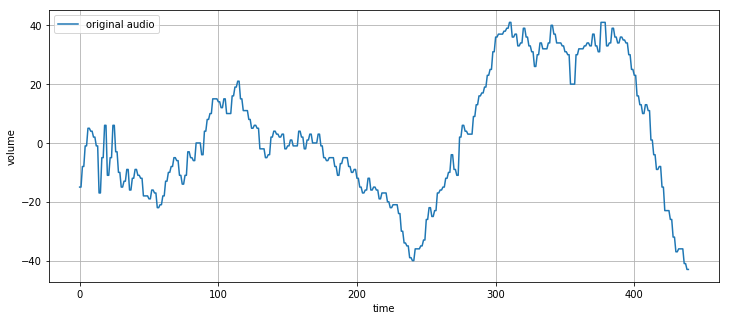

In [121]:
plt.figure(figsize=(12,5))

plt.plot(audio_book_output[1000:1005].get_array_of_samples(), label='original audio')

plt.xlabel('time')
plt.ylabel('volume')
plt.grid()
plt.legend()

### Реализуем функцию, которая будет трансформировать входной файл wav-файл в 64Kbps *.mp3, а потом обратно в *.wav

In [122]:
def signal_transformer(audio, filename='output/Sound transformer output/output_transform.wav', bitrate='64k'):
    """
    Parameters:
        audio: pydub.audio_segment.AudioSegment
            This is input audio file.
            
        filename: str, default: output_transform.wav
            This is name of output file.
            
        bitrate: str, default: '64k'
            This is bitrate of output file.
            
    """
    temp = None
    with NamedTemporaryFile(mode='w+b', suffix='.mp3', delete=False) as f:
        temp = f.name
        audio.export(temp, format='mp3', bitrate=bitrate)
        to_wav = AudioSegment.from_mp3(temp)
        
        path = '/'.join(filename.split('/')[:-1])
        if not os.path.exists(path):
            os.mkdir(path)
            
        to_wav.export(filename, format=filename.split('.')[-1])
    # print(temp)
    os.remove(temp)

#### Применим эту функцию для полученной дорожки с прошлого пункта

In [123]:
signal_transformer(audio_book_output)

#### Откроем полученный файл и прослушаем результат

In [124]:
audio_book_output_transform = AudioSegment.from_file("output/Sound transformer output/output_transform.wav", format='wav')

In [125]:
audio_book_output_transform

+ Заметно, что качество звука стало чуть хуже

#### Построим график для файла output_transform.wav на интервале от 0:01:000 до 0:01:050 секунд

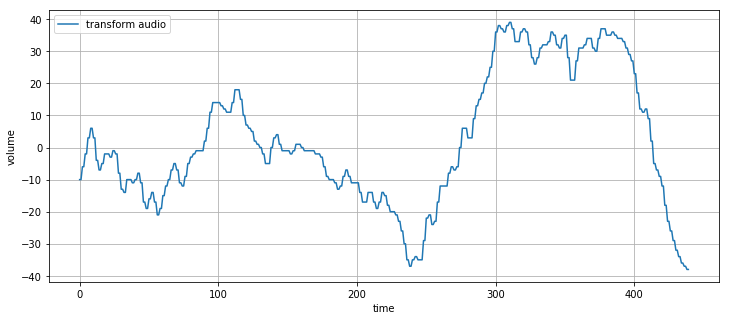

In [126]:
plt.figure(figsize=(12,5))

plt.plot(audio_book_output_transform[1000:1005].get_array_of_samples(), label='transform audio')

plt.xlabel('time')
plt.ylabel('volume')
plt.grid()
plt.legend()

#### Построим график с наложением звука до превращения и после на интервале от 0:01:000 до 0:01:050 секунд

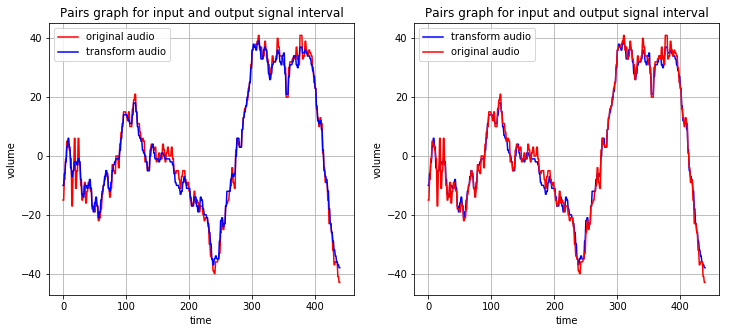

In [127]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5))

ax1.plot(audio_book_output[1000:1005].get_array_of_samples(), color='red', label='original audio')
ax1.plot(audio_book_output_transform[1000:1005].get_array_of_samples(), color='blue', label='transform audio')
ax1.set_xlabel('time')
ax1.set_ylabel('volume')
ax1.set_title('Pairs graph for input and output signal interval')
ax1.grid()
ax1.legend()

ax2.plot(audio_book_output_transform[1000:1005].get_array_of_samples(), color='blue', label='transform audio')
ax2.plot(audio_book_output[1000:1005].get_array_of_samples(), color='red', label='original audio')
ax2.set_xlabel('time')
ax2.set_ylabel('volume')
ax2.set_title('Pairs graph for input and output signal interval')
ax2.grid()
ax2.legend()

+ Видно, что график слегка преобразился (изменилось положение локальных пиков)

### Добавление шума в модель

#### Аддитивный шум: гауссовский (AWGN)

In [128]:
def add_awgn(audio, start=0, duration=1000*5, loc=0.0, scale=1.0, filename='output/Communication channel model/output_awgn.wav'):
    """
    Parameters:
        audio: pydub.audio_segment.AudioSegment
            This is input audio file.
            
        start: int, float, default: 0 ms
            This is start of AWGN.
            
        duration: int, float, default: 1000*2*60 ms
            This is duration of AWGN.
            
        loc: float, default: 0.0
            Mean ("centre") of the distribution.
            
        scale: float, default: 1.0
            Standard deviation (spread or "width") of the distribution.
            
        filename: str, default: output_awgn.wav
            This is name of output file.
            
        Return:
            Output audio file with AWGN.
    """
    length = len(audio)
    if length < start + duration + 1:
        duration = length - start - 1
    
    normal_noise = np.int16(np.random.normal(loc=loc, scale=scale, size=len(audio[start:start + duration].get_array_of_samples())))
    
    output_array = np.array(audio.get_array_of_samples())
    
    left_bound = int(2 * (start / 1000) * (audio.frame_rate))
    right_bound = len(audio[start:(start + duration)].get_array_of_samples())
    
    output_array[left_bound:left_bound + right_bound] += normal_noise
    
    output_audio = AudioSegment(data=output_array.tobytes(),
                                sample_width=audio.sample_width,
                                frame_rate=audio.frame_rate,
                                channels=audio.channels)
    
    path = '/'.join(filename.split('/')[:-1])
    if not os.path.exists(path):
        os.mkdir(path)
    
    output_audio.export(filename, format=filename.split('.')[-1])
    
    return output_audio

In [129]:
sound_with_awgn = add_awgn(audio_book_output_transform, start=1000, duration=2000, scale=10)

In [130]:
sound_with_awgn

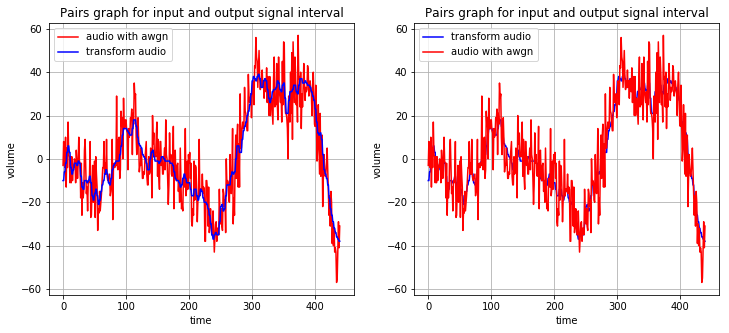

In [131]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5))

ax1.plot(sound_with_awgn[1000:1005].get_array_of_samples(), color='red', label='audio with awgn')
ax1.plot(audio_book_output_transform[1000:1005].get_array_of_samples(), color='blue', label='transform audio')
ax1.set_xlabel('time')
ax1.set_ylabel('volume')
ax1.set_title('Pairs graph for input and output signal interval')
ax1.grid()
ax1.legend()

ax2.plot(audio_book_output_transform[1000:1005].get_array_of_samples(), color='blue', label='transform audio')
ax2.plot(sound_with_awgn[1000:1005].get_array_of_samples(), color='red', label='audio with awgn')
ax2.set_xlabel('time')
ax2.set_ylabel('volume')
ax2.set_title('Pairs graph for input and output signal interval')
ax2.grid()
ax2.legend()

#### Случайные подавления (occasional mutes)

In [132]:
def add_mute(audio, start=0, duration=1000*5, filename='output/Communication channel model/output_mute.wav'):
    """
    Parameters:
        audio: pydub.audio_segment.AudioSegment
            This is input audio file.
            
        start: int, float, default: 0 ms
            This is start of occasional mute.
            
        duration: int, float, default: 1000*2*60 ms
            This is duration of occasional mute.
            
        filename: str, default: output_mute.wav
            This is name of output file.
            
        Return:
            Output audio file with occasional mutes.
    """
    length = len(audio)
    if length < start + duration + 1:
        duration = length - start - 1
    
    mutes = np.zeros(shape=len(audio[start:start + duration].get_array_of_samples()), dtype=np.int16)
    
    output_array = np.array(audio.get_array_of_samples())
    
    left_bound = int(2 * (start / 1000) * (audio.frame_rate))
    right_bound = len(audio[start:(start + duration)].get_array_of_samples())
    
    output_array[left_bound:left_bound + right_bound] = mutes
    
    output_audio = AudioSegment(data=output_array.tobytes(),
                                sample_width=audio.sample_width,
                                frame_rate=audio.frame_rate,
                                channels=audio.channels)
    
    path = '/'.join(filename.split('/')[:-1])
    if not os.path.exists(path):
        os.mkdir(path)
    
    output_audio.export(filename, format=filename.split('.')[-1])
    
    return output_audio

In [133]:
sound_with_mute = add_mute(audio_book_output_transform, start=1000, duration=2000)

In [134]:
sound_with_mute

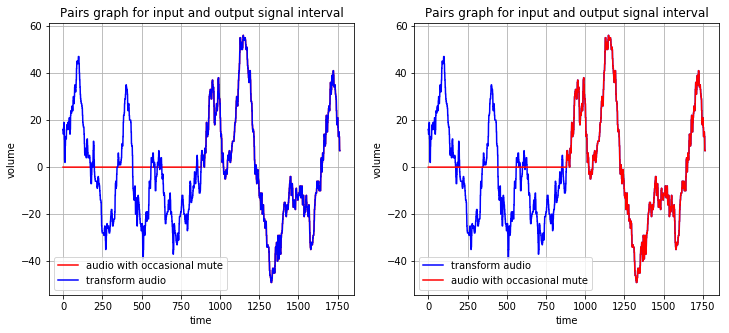

In [135]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5))

ax1.plot(sound_with_mute[2990:3010].get_array_of_samples(), color='red', label='audio with occasional mute')
ax1.plot(audio_book_output_transform[2990:3010].get_array_of_samples(), color='blue', label='transform audio')
ax1.set_xlabel('time')
ax1.set_ylabel('volume')
ax1.set_title('Pairs graph for input and output signal interval')
ax1.grid()
ax1.legend()

ax2.plot(audio_book_output_transform[2990:3010].get_array_of_samples(), color='blue', label='transform audio')
ax2.plot(sound_with_mute[2990:3010].get_array_of_samples(), color='red', label='audio with occasional mute')
ax2.set_xlabel('time')
ax2.set_ylabel('volume')
ax2.set_title('Pairs graph for input and output signal interval')
ax2.grid()
ax2.legend()

#### Occasional distortion

In [228]:
def add_distortion(audio, start=0, duration=1000*5, amplitude=100, filename='output/Communication channel model/output_distortion.wav', plot=False):
    """
    Parameters:
        audio: pydub.audio_segment.AudioSegment
            This is input audio file.
            
        start: int, float, default: 0 ms
            This is start of occasional distortion.
            
        duration: int, float, default: 1000*2*60 ms
            This is duration of occasional distortion.
            
        amplitude: int, float, default: 100
            Max value of amplitude.
            
        filename: str, default: output_distortion.wav
            This is name of output file.
            
        plot: bool, default: False
            This variable specifies whether graphs should be drawn.
            
        Return:
            Output audio file with occasional distortion.
    """
    length = len(audio)
    if length < start + duration + 1:
        duration = length - start - 1
    
    samples = audio[start:start + duration].get_array_of_samples()
    n = len(samples)
    
    amplitude *= (n / 2.0)
    
    rfft = np.fft.rfft(samples)
    freq = np.fft.rfftfreq(n)
    
    procces_rfft = np.array([x if np.abs(x) < amplitude else np.sign(x) * amplitude for x in rfft])
    
    irfft = np.fft.irfft(procces_rfft)
    
    output_array = np.array(audio.get_array_of_samples())
    
    left_bound = int(2 * (start / 1000) * (audio.frame_rate))
    
    output_array[left_bound:left_bound + n] = irfft
    
    output_audio = AudioSegment(data=output_array.tobytes(),
                                sample_width=audio.sample_width,
                                frame_rate=audio.frame_rate,
                                channels=audio.channels)
    
    path = '/'.join(filename.split('/')[:-1])
    if not os.path.exists(path):
        os.mkdir(path)
    
    output_audio.export(filename, format=filename.split('.')[-1])
    
    if(plot):
        fig, ax = plt.subplots(2, 2, figsize=(20,10))
        
        ax[0][0].plot(freq, ((2.0 * np.abs(rfft)) / n), color='blue', label='Original plot')
        ax[0][0].plot(freq, ((2.0 * np.abs(procces_rfft)) / n), color='red', label='Plot with distortion, where max amplitude = %.1f' % float(2 * amplitude / n))
        ax[0][0].set_ylabel('amplitude (rfft)')
        ax[0][0].set_xlabel('frequency (freq)')
        ax[0][0].set_title('RFFT plot')
        ax[0][0].legend()
        ax[0][0].grid()
        
        ax[1][0].plot(irfft, color='blue', label='Original signal')
        ax[1][0].plot(samples, color='red', label='Signal with distortion')
        ax[1][0].set_xlabel('time')
        ax[1][0].set_ylabel('amplitude (irfft)')
        ax[1][0].set_title('IRFFT plot')
        ax[1][0].legend()
        ax[1][0].grid()
        
        ax[1][1].plot(samples, color='red', label='Signal with distortion')
        ax[1][1].plot(irfft, color='blue', label='Original signal')
        ax[1][1].set_xlabel('time')
        ax[1][1].set_ylabel('amplitude (irfft)')
        ax[1][1].set_title('IRFFT plot')
        ax[1][1].legend()
        ax[1][1].grid()
        
    return output_audio

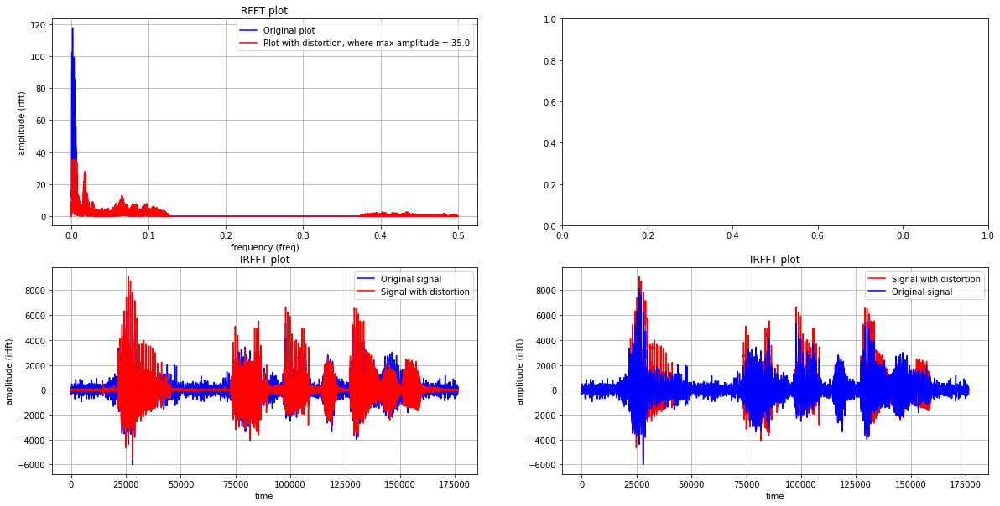

In [229]:
sound_with_distortion = add_distortion(audio_book_output_transform, start=1000, duration=2000, amplitude=35, plot=True)

In [220]:
sound_with_distortion